<a href="https://colab.research.google.com/github/Ducmono/Machine-Learning-Classification-CNN-Regression/blob/main/Sq%26Rats.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import cv2
from tqdm import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')
import tensorflow_datasets as tfds

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def resize_and_pad(image, target_size=(128, 128), pad_color=0):
    h, w = image.shape[:2]
    target_w, target_h = target_size

    scale = min(target_w / w, target_h / h)
    new_w, new_h = int(w * scale), int(h * scale)

    resized = cv2.resize(image, (new_w, new_h))
    padded = np.full((target_h, target_w, 3), pad_color, dtype=np.uint8)

    x_offset = (target_w - new_w) // 2
    y_offset = (target_h - new_h) // 2
    padded[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized

    return padded

# Đường dẫn gốc và nơi lưu ảnh sau xử lý
src_root = "/content/drive/MyDrive/dataset/PetImages"
dst_root = "/content/drive/MyDrive/sq_rat_128x128"
os.makedirs(dst_root, exist_ok=True)

input_path = []
label = []

# Lặp qua từng class
for class_name in os.listdir(src_root):
    class_path = os.path.join(src_root, class_name)
    if not os.path.isdir(class_path):
        continue  # Bỏ qua file lạ

    dst_class_path = os.path.join(dst_root, class_name)
    os.makedirs(dst_class_path, exist_ok=True)

    for filename in tqdm(os.listdir(class_path), desc=f'Processing {class_name}'):
        src_img_path = os.path.join(class_path, filename)
        dst_img_path = os.path.join(dst_class_path, filename)

        try:
            img = cv2.imread(src_img_path)
            if img is None:
                continue  # Bỏ qua ảnh lỗi

            processed_img = resize_and_pad(img, target_size=(128, 128))
            cv2.imwrite(dst_img_path, processed_img)

            # Cập nhật input_path và label theo đường dẫn mới
            input_path.append(dst_img_path)
            label.append(0 if class_name == 'Rats' else 1)
        except Exception as e:
            print(f"Lỗi xử lý {src_img_path}: {e}")

print(input_path[0], label[0])


Processing Rats: 100%|██████████| 1491/1491 [00:42<00:00, 35.03it/s]

/content/drive/MyDrive/sq_rat_128x128/Squirrel/4 (178) - Copy.jpg 1


In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
print(df.shape)
print(df)

(2937, 2)
                                                 images  label
0     /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0
1     /content/drive/MyDrive/sq_rat_128x128/Squirrel...      1
2     /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0
3     /content/drive/MyDrive/sq_rat_128x128/Squirrel...      1
4     /content/drive/MyDrive/sq_rat_128x128/Squirrel...      1
...                                                 ...    ...
2932  /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0
2933  /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0
2934  /content/drive/MyDrive/sq_rat_128x128/Squirrel...      1
2935  /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0
2936  /content/drive/MyDrive/sq_rat_128x128/Rats/Wha...      0

[2937 rows x 2 columns]


In [ ]:
from PIL import Image

l = []
for image in df['images']:
    try:
        with Image.open(image) as img:
            img.verify()  # Chỉ kiểm tra định dạng ảnh, KHÔNG load toàn bộ
    except Exception as e:
        l.append(image)


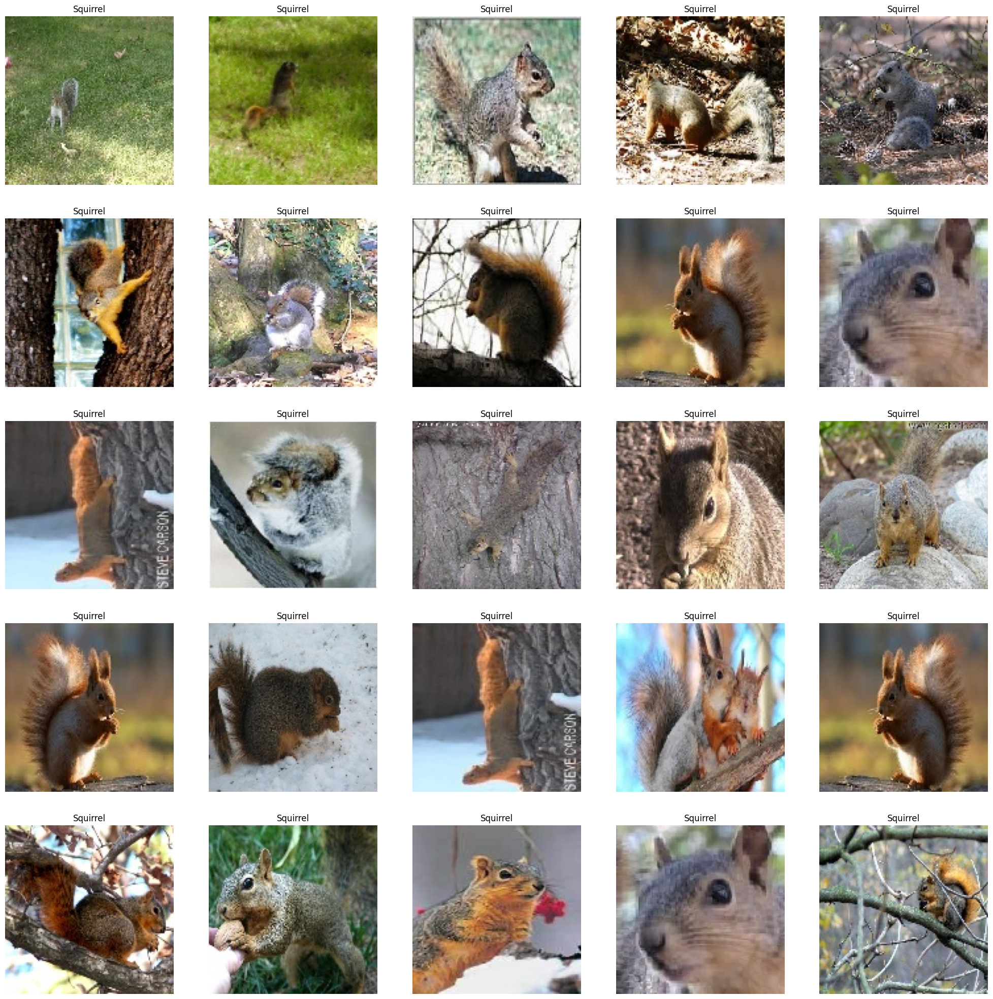

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Squirrel')
    plt.axis('off')

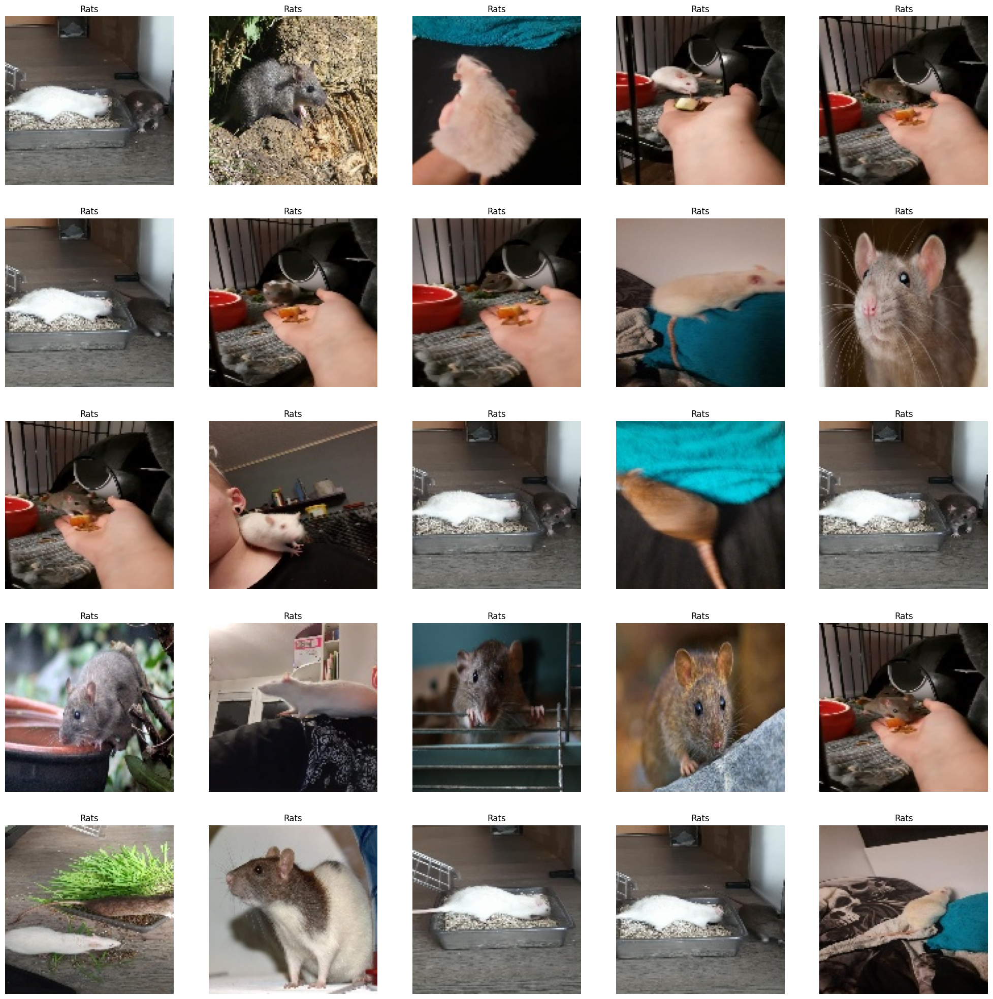

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Rats')
    plt.axis('off')

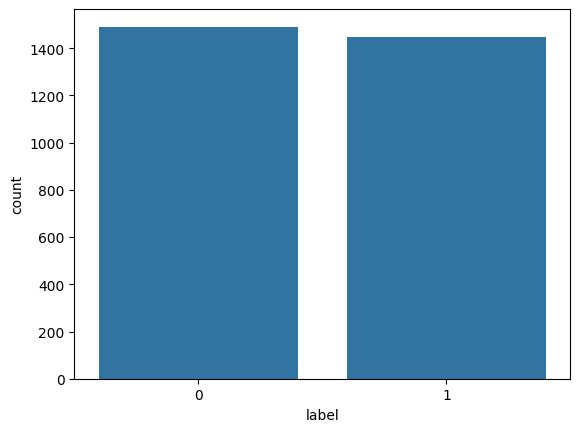

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(x='label', data=df)
plt.show()


In [ ]:
print(df['label'].value_counts())

label
0    1491
1    1446
Name: count, dtype: int64


In [ ]:
df['label'] = df['label'].astype('str')
df.head(1000)

,images,label
0,/content/drive/MyDrive/sq_rat_128x128/Rats/Wha...,0
1,/content/drive/MyDrive/sq_rat_128x128/Squirrel...,1
2,/content/drive/MyDrive/sq_rat_128x128/Rats/Wha...,0
3,/content/drive/MyDrive/sq_rat_128x128/Squirrel...,1
4,/content/drive/MyDrive/sq_rat_128x128/Squirrel...,1
...,...,...
995,/content/drive/MyDrive/sq_rat_128x128/Squirrel...,1
996,/content/drive/MyDrive/sq_rat_128x128/Rats/Wha...,0
997,/content/drive/MyDrive/sq_rat_128x128/Rats/How...,0
998,/content/drive/MyDrive/sq_rat_128x128/Rats/get...,0


In [ ]:
from sklearn.model_selection import train_test_split

X = df['images']
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)
print(X_train.shape, X_test.shape)

(2349,) (588,)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 20,# augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)#Khởi tạo ImageDataGenerator

# Create the 'train' DataFrame by concatenating X_train and y_train
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)
train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=32,
    class_mode='binary'
)

# Create the 'test' DataFrame by concatenating X_test and y_test

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=32,
    class_mode='binary'
)

Found 2349 validated image filenames belonging to 2 classes.
Found 588 validated image filenames belonging to 2 classes.


rescale=1./255: Chuẩn hóa ảnh từ [0, 255] về [0, 1].

rotation_range=20: Xoay ảnh ngẫu nhiên trong khoảng ±20 độ.

shear_range=0.2: Áp dụng shear transformation (biến dạng ảnh).

zoom_range=0.2: Zoom ngẫu nhiên trong khoảng ±20%.

horizontal_flip=True: Lật ảnh ngang ngẫu nhiên.

fill_mode='nearest': Khi biến đổi làm mất dữ liệu ở rìa, pixel gần nhất sẽ được dùng để điền vào.



In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(128, activation='relu'),# mã hoá đặc trưng
                    Dense(1, activation='sigmoid')#output 1 neuron duy nhất
])

In [ ]:
from keras.optimizers import Adam
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     7,372,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,392,449 (28.20 MB)

 Trainable params: 7,392,449 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Sequential: Mô hình tuyến tính gồm các lớp xếp chồng lên nhau từng lớp một (phù hợp với CNN cơ bản).

Conv2D: Lớp tích chập 2 chiều – dùng để trích xuất đặc trưng từ ảnh.

MaxPool2D: Lớp giảm kích thước (downsampling) giúp giảm số lượng tham số và tăng tính khái quát.

Flatten: Chuyển dữ liệu 2D thành vector 1D để đưa vào các lớp Dense.


In [ ]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)
# model.save("model.keras")

Tổng số tham số (trainable): 6,447,137
tầng Dense chiếm phần lớn tham số → có thể áp dụng giảm chiều Flatten hoặc thêm Dropout nếu bị overfitting.

In [ ]:
# import numpy as np
# from sklearn.model_selection import StratifiedKFold
# from tensorflow.keras import layers, Sequential
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
# import pandas as pd
# import cv2

# print(X_train.shape, X_test.shape)
# # ==== HÀM XỬ LÝ ẢNH ====
# def load_and_preprocess_image(image_path, target_size=(128, 128)):
#     img = cv2.imread(image_path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert BGR to RGB
#     img = cv2.resize(img, target_size)
#     img = img / 255.0  # Normalize pixel values
#     return img

# # ==== HÀM TẠO MODEL CNN ====
# def create_model(input_shape):
#     model = Sequential([
#         Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
#         MaxPool2D((2,2)),
#         Conv2D(64, (3,3), activation='relu'),
#         MaxPool2D((2,2)),
#         Flatten(),
#         Dense(128, activation='relu'),
#         Dense(1, activation='sigmoid')
#     ])
#     model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#     return model


# # =========================
# # 🔹 PHẦN 1: CROSS-VALIDATION (KHÔNG AUGMENTATION)
# # =========================
# kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# fold_scores = []

# for fold, (train_idx, val_idx) in enumerate(kf.split(X_train, y_train)):
#     print(f"\n🔹 Fold {fold+1}")

#     X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
#     y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

#     # Load và xử lý ảnh cho fold hiện tại
#     X_tr_processed = np.array([load_and_preprocess_image(img_path) for img_path in X_train])
#     X_val_processed = np.array([load_and_preprocess_image(img_path) for img_path in X_test])

#     y_tr_processed = np.array(y_train).astype(int)
#     y_val_processed = np.array(y_test).astype(int)

#     model = create_model((128, 128, 3))
#     model.fit(X_tr_processed, y_tr_processed, epochs=3, batch_size=32, verbose=1)

#     val_loss, val_acc = model.evaluate(X_val_processed, y_val_processed, verbose=0)
#     print(f"✅ Fold {fold+1} accuracy: {val_acc:.4f}")
#     fold_scores.append(val_acc)

# print("\n📊 CV scores:", fold_scores)
# print("📈 Mean accuracy:", np.mean(fold_scores))

In [ ]:
# # 🔹 PHẦN 2: FINAL MODEL VỚI AUGMENTATION (ImageDataGenerator)
# # =========================
# print("\nTraining final model with Data Augmentation...")

# # Khởi tạo ImageDataGenerator cho train & val
# train_generator = ImageDataGenerator(
#     rotation_range = 20,
#     shear_range = 0.2,
#     zoom_range = 0.2,
#     horizontal_flip = True,
#     fill_mode = 'nearest'
# )

# val_generator = ImageDataGenerator() # No augmentation for validation

# # Use .flow() with processed image data
# train_iterator = train_generator.flow(
#     X_tr_processed,
#     y_tr_processed,
#     batch_size=32
# )

# val_iterator = val_generator.flow(
#     X_val_processed,
#     y_val_processed,
#     batch_size=32
# )

# print(X_tr_processed.shape, y_tr_processed.shape)
# print(X_val_processed.shape, y_val_processed.shape)
# images, labels = next(train_iterator)

# # Hiển thị 9 ảnh đầu tiên sau augment
# plt.figure(figsize=(8,8))
# for i in range(9):
#     plt.subplot(3,3,i+1)
#     plt.imshow(images[i])
#     plt.axis("off")
# plt.show()
# # Train final model with augmentation
# # Use the iterators for training and validation
# final_model = create_model((128, 128, 3))
# history= final_model.fit(train_iterator, epochs=10, validation_data=val_iterator, batch_size=32 ,verbose=1)

# # Save model
# final_model.save("model.keras")
# print("\n✅ Final model saved as model.keras")

# # Evaluate on test set
# print("\nEvaluating the final model on the test set...")
# test_loss, test_acc = final_model.evaluate(val_iterator, verbose=0)
# print("🎯 Test accuracy:", test_acc)

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras import layers, regularizers, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
import pandas as pd
import cv2 # Import cv2 to read images

# Define X_train, y_train, X_test, y_test from the train and test DataFrames
print(X_train.shape, X_test.shape)
# Function to load and preprocess image
def load_and_preprocess_image(image_path, target_size=(128, 128)):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert BGR to RGB
    img = cv2.resize(img, target_size)
    img = img / 255.0  # Normalize pixel values
    return img


# Hàm tạo model CNN
def create_model(input_shape):
    model = Sequential([
                    Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(128, activation='relu'),# mã hoá đặc trưng
                    Dense(1, activation='sigmoid')#output 1 neuron duy nhất
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Cross-validation thủ công
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold_scores = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train, y_train)):
    print(f"\n🔹 Fold {fold+1}")
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Load and preprocess images for the current fold
    X_tr_processed = np.array([load_and_preprocess_image(img_path) for img_path in X_train])
    X_val_processed = np.array([load_and_preprocess_image(img_path) for img_path in X_test])
    # Convert labels to integers
    y_tr_processed = np.array(y_train).astype(int)
    y_val_processed = np.array(y_test).astype(int)


    model = create_model((128, 128, 3))
    model.fit(X_tr_processed, y_tr_processed, epochs=3, batch_size=32, verbose=1)  # epochs=3 để nhanh hơn

    val_loss, val_acc = model.evaluate(X_val_processed, y_val_processed, verbose=0)
    print(f"✅ Fold {fold+1} accuracy: {val_acc:.4f}")
    fold_scores.append(val_acc)

print("\n📊 CV scores:", fold_scores)
print("📈 Mean accuracy:", np.mean(fold_scores))

# Train final model on the entire training dataset and save it
print("\nTraining final model on the entire training dataset...")
final_model = create_model((128, 128, 3))
print(X_tr_processed.shape)
history= final_model.fit(X_tr_processed, y_tr_processed, epochs=5, batch_size=32, verbose=1, validation_data=(X_val_processed, y_val_processed)) # Added validation_data

# Save model
final_model.save("model.keras")

# Use the existing train_iterator and val_iterator from cell _lki54e_ZYhB

print("\nFinal model saved as model.keras")

# Evaluate the final model on the test set
print("\nEvaluating the final model on the test set...")
test_loss, test_acc = final_model.evaluate(val_iterator, verbose=0) # Using val_iterator as the test set iterator
print("🎯 Test accuracy:", test_acc)

(2349,) (588,)

🔹 Fold 1
Epoch 1/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 55s 724ms/step - accuracy: 0.6885 - loss: 0.6902
Epoch 2/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 81s 714ms/step - accuracy: 0.9109 - loss: 0.2431
Epoch 3/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 83s 731ms/step - accuracy: 0.9676 - loss: 0.1178
✅ Fold 1 accuracy: 0.9388

🔹 Fold 2
Epoch 1/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 55s 718ms/step - accuracy: 0.6938 - loss: 0.8791
Epoch 2/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 81s 713ms/step - accuracy: 0.8871 - loss: 0.2801
Epoch 3/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 83s 724ms/step - accuracy: 0.9592 - loss: 0.1436
✅ Fold 2 accuracy: 0.9609

🔹 Fold 3
Epoch 1/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 56s 741ms/step - accuracy: 0.6492 - loss: 0.8867
Epoch 2/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 53s 716ms/step - accuracy: 0.8737 - loss: 0.3034
Epoch 3/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 84s 742ms/step - accuracy: 0.9468 - loss: 0.1510
✅ Fold 3 accuracy: 0.9354

🔹 Fold 4
Epoch 1/3
74/74 ━━━━━━━━━━━━━━━━━━━━ 54s 692ms/step - accuracy: 0.7143 - loss: 0.6130
Epoch 2

pred, xác thực chéo, turning, xem kỹ CNN,check lại ảnh,chỉnh size ảnh

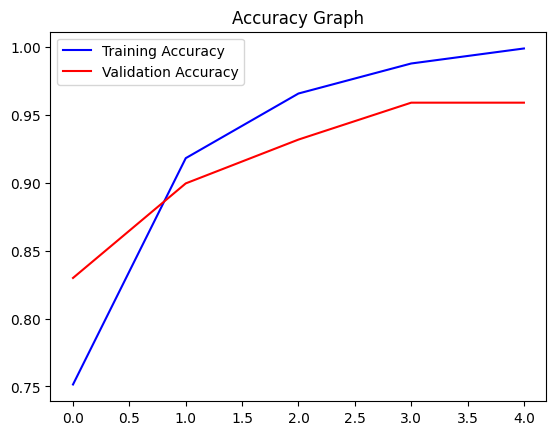

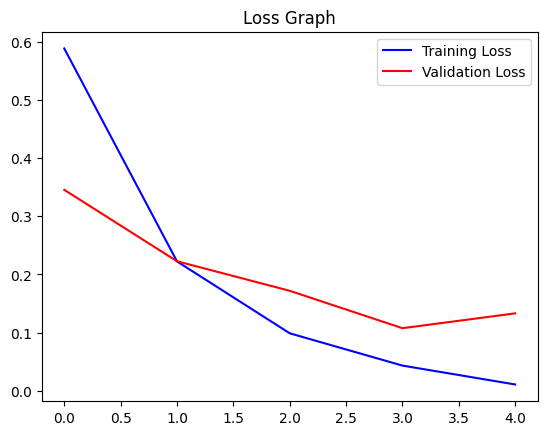

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

Prediction vector: [[0.02296418]]
Predicted label: Squirrel (confidence: 0.02)


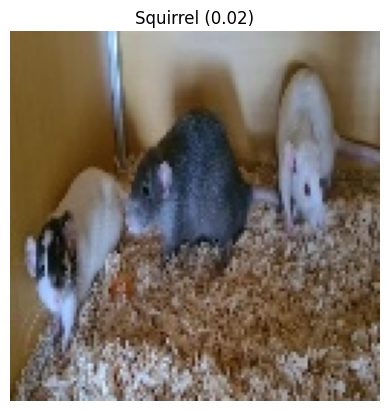

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load model đã huấn luyện
model = load_model("model.keras")

# Danh sách nhãn tương ứng với output model
class_labels = ["Squirrel", "Rats"]

# Chọn 1 ảnh trong tập train để thử dự đoán
train_image_path = "/content/drive/MyDrive/sq_rat_128x128/Rats/126303257_760x570_jpg.rf.04b0847fd442dbcc73e6da433167d108.jpg"

# Load và tiền xử lý ảnh
img = load_img(train_image_path, target_size=(128, 128))
img_array = img_to_array(img) / 255.0  # Chuẩn hóa 0-1
img_array = np.expand_dims(img_array, axis=0)  # Thêm chiều batch

# Dự đoán
pred = model.predict(img_array, verbose=0)

# Xác định nhãn dự đoán
predicted_class = np.argmax(pred, axis=1)[0]  # Lấy index nhãn
predicted_label = class_labels[predicted_class]
confidence = pred[0][predicted_class]

# In kết quả
print(f"Prediction vector: {pred}")
print(f"Predicted label: {predicted_label} (confidence: {confidence:.2f})")

# Hiển thị ảnh với nhãn dự đoán
plt.imshow(img)
plt.axis('off')
plt.title(f"{predicted_label} ({confidence:.2f})")
plt.show()


0: 1f9051fd-image001_png.rf.2bdaf3d7fcea4104f95b8b8cb9538446.jpg -> pred.shape=(1, 1), pred=[[0.02821814]]
1: image_21_jpg.rf.a9a1554be5ceb690c353e874c458c1e2.jpg -> pred.shape=(1, 1), pred=[[0.99971807]]
2: image_40_jpg.rf.c9dc0c30f51853060af0105a4bea5073.jpg -> pred.shape=(1, 1), pred=[[0.9995621]]
3: image_51_jpg.rf.17edc4c3400d039a5f506e6166c25395.jpg -> pred.shape=(1, 1), pred=[[0.9993228]]
4: image_38_jpg.rf.1a8fff8903390edc055678a20906b7f1.jpg -> pred.shape=(1, 1), pred=[[0.9999595]]
5: image_2_jpg.rf.e4d512963286c9afc490b6feb59c9261.jpg -> pred.shape=(1, 1), pred=[[0.999655]]
6: 9d5c97ef-images_jpeg.rf.115f8ddc50ac4b1b781fde5b062150ca.jpg -> pred.shape=(1, 1), pred=[[0.01335344]]
7: cd5c4d34-Screenshot_2023-12-13_233922_png.rf.68aa2239729be3da7c0bcced7e6fa69f.jpg -> pred.shape=(1, 1), pred=[[8.014883e-05]]
8: image_2_jpg.rf.8b28c1b4fccbf298989db733d6a15c3c.jpg -> pred.shape=(1, 1), pred=[[0.99868625]]
9: 7dcd96b1-230609142445-paris-rats-cohabitation-intl_jpg.rf.1ee5f2bcb97b9ba9

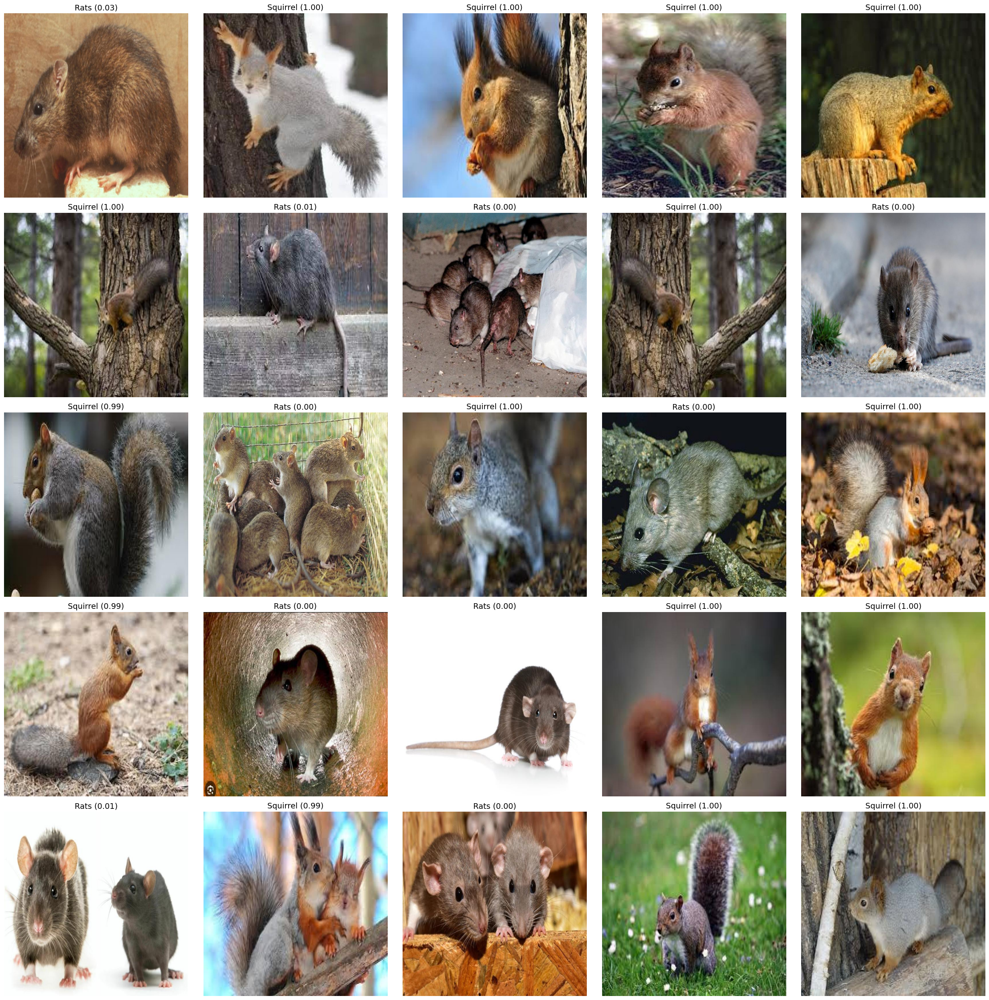

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model


# Load model đã huấn luyện
model = load_model("model.keras")
labels = ['Rats', 'Squirrel']

# Thư mục test chứa ảnh
test_dir = "/content/drive/MyDrive/dataset/test"
image_files = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

# Chọn ngẫu nhiên 25 ảnh để hiển thị
random.shuffle(image_files)
image_files = image_files[:25] # Limit to 25 images

plt.figure(figsize=(25,25))
# Iterate through the list of image files
for idx, img_path in enumerate(image_files):
    # load (ép về RGB chắc chắn) và tiền xử lý
    img = load_img(img_path, target_size=(128, 128), color_mode='rgb')
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # predict
    pred = model.predict(img_array, verbose=0)
    pred = np.array(pred)  # chắc chắn là numpy array

    # debug info: in ra shape và giá trị pred
    print(f"{idx}: {os.path.basename(img_path)} -> pred.shape={pred.shape}, pred={pred}")

    # interpret prediction robustly
    if pred.ndim == 2 and pred.shape[1] == 2:
        # Softmax 2-class -> argmax
        class_idx = int(np.argmax(pred, axis=1)[0])
        prob = float(pred[0, class_idx])
    elif pred.ndim == 2 and pred.shape[1] == 1:
        # Sigmoid returning one probability
        prob = float(pred[0,0])
        class_idx = 1 if prob > 0.5 else 0
    else:
        # các trường hợp khác (flatten)
        flat = pred.ravel()
        if flat.size == 2:
            class_idx = int(np.argmax(flat))
            prob = float(flat[class_idx])
        else:
            prob = float(flat[0])
            class_idx = 1 if prob > 0.5 else 0

    label = f"{labels[class_idx]} ({prob:.2f})"

    # Hiển thị
    plt.subplot(5, 5, idx + 1)
    plt.imshow(load_img(img_path))  # hiển thị ảnh gốc
    plt.title(label, fontsize=14)
    plt.axis('off')

plt.tight_layout()
plt.show()